# Index

- [gwifi Dynamic energy](#dyn)
- [gwifi Overall energy](#tot)
- [gwifi Performance](#perf)

# Utilities

In [31]:
options(warn=-1)
library(plyr); library(dplyr)
library(ggplot2)
library(tidyr)
#library(tikzDevice)
library(gridExtra)
library(ggpubr)
library(plotly)
library(ggquadrilateral)
library(cowplot)
library(ggsci)
library(reshape2)

setwd("/home/clem/Code/github.com/klementc/wifi_energy_experiments/large_use_case/")

In [32]:
#+++++++++++++++++++++++++
# Fonction pour calculer la moyenne et l'écart-type
# pour chaque groupe
#+++++++++++++++++++++++++
# data : une data frame
# varname: le nom de la colonne contenant la variable 
  # d'intérêt 
# groupnames : vecteur contenant les noms des colonnes à utiliser
  # comme des variables de grouping 
data_summary <- function(data, varname, groupnames){
  require(plyr)
  summary_func <- function(x, col){
    c(mean = mean(x[[col]], na.rm=TRUE),
      sd = sd(x[[col]], na.rm=TRUE))
  }
  data_sum<-ddply(data, groupnames, .fun=summary_func,
                  varname)
  data_sum <- plyr::rename(data_sum, c("mean" = varname))
 return(data_sum)
}

<a id="dyn"></a>
# Dynamic energy consumption

The logs obtained by running this experiment are in the archive: `logs/1670056211.tar.xz`, the parsed results in `logs/1669831570/results.csv`

### Settings

Launcher file name: `run_control_frames_dyn.sh`

```sh
nbCells="$(seq 5 1 15)"
AP_BW="38.0Mbps" # 44.23
seedsPlatf="$(seq 1 1 5)"
seedsNS="$(seq 1 1 30)" #30)"
verbose_flow_th=0

startTime="10"
endTime="100"
simTime="1100"
useNS3=1
corrF="0.0021"
local_only=0

type="norm"

### options for "rand"
minSTAPerCell="20"
maxSTAPerCell="20"
minSize="10000000"
maxSize="30000000"
minNbMsg=1
maxNbMsg=1
minIntervalBetweenMsg=10
maxIntervalBetweenMsg=20

### options for "norm"
meanStaPerCell=17
devStaPerCell=2
meanSize="1500000"
devSize="100000"
avgNbMsg=20 #35
devNbMsg=7 #7
meanIntervalBetweenMsg=25
devIntervalBetweenMsg=5

```

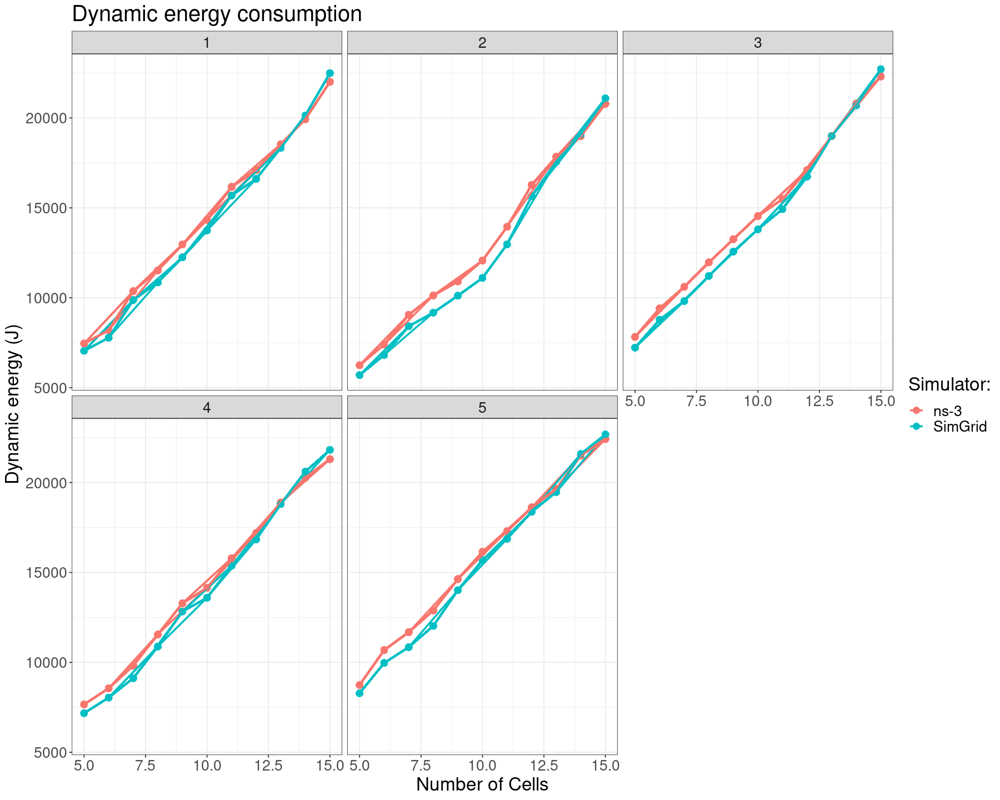

In [33]:
d <- as_tibble(read.csv(paste("logs/1670056211/","/results.csv", sep="")))%>% mutate(cleansimulator=ifelse(simulator=="ns3", "ns-3","SimGrid"))

options(repr.plot.width=15, repr.plot.height=12)
g <- ggplot(data=d) +
  geom_point(aes(x=nbCells, y=totEnergy, group=interaction(cleansimulator,factor(seedNS)), color=cleansimulator), size=3)+
  geom_line(aes(x=nbCells, y=totEnergy, group=interaction(cleansimulator,factor(seedNS)), color=cleansimulator), size=1)+
  theme_bw()+
  facet_wrap(~seedP)+
  labs(y= "Dynamic energy (J)", x = "Number of Cells", color='Simulator:', fill='Simulator:')+
  theme(text = element_text(size = 20))+
  ggtitle("Dynamic energy consumption")
g

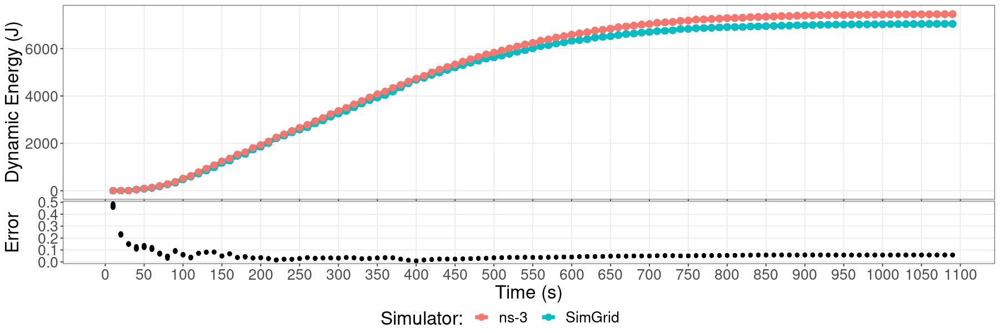

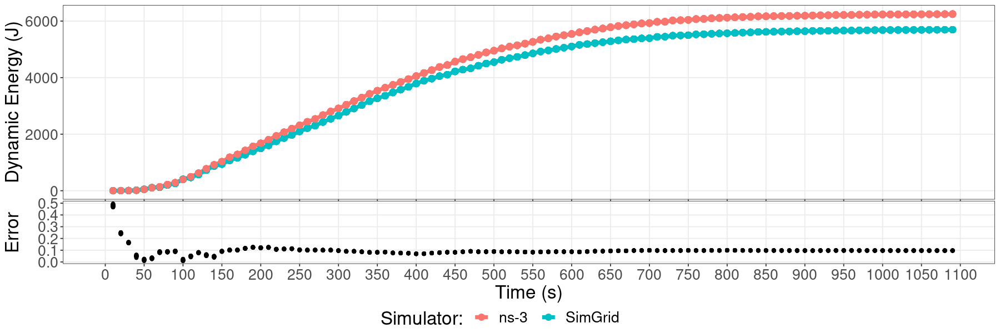

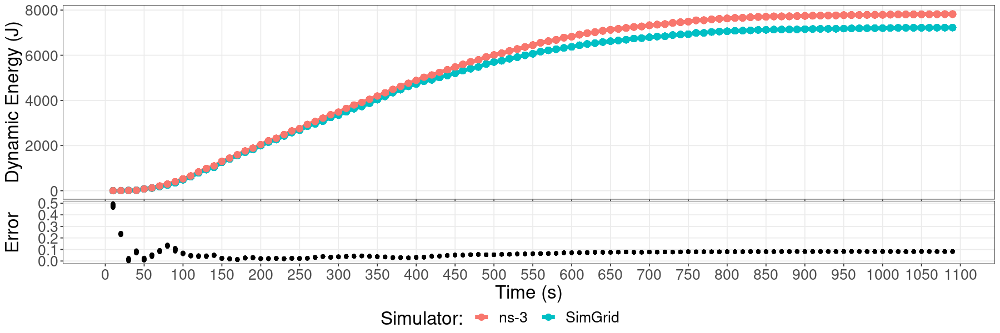

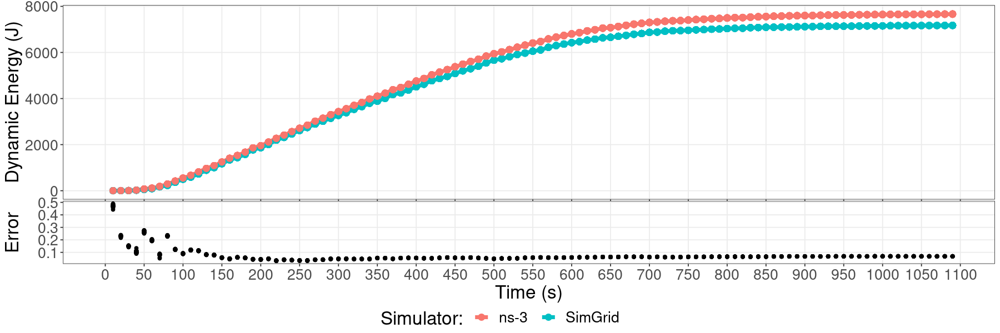

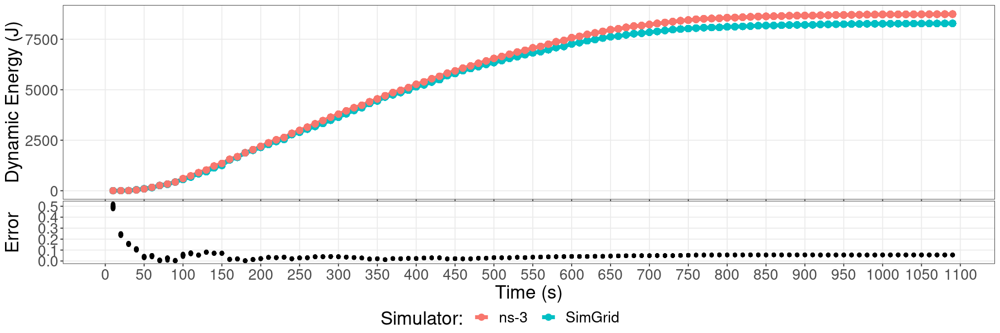

...

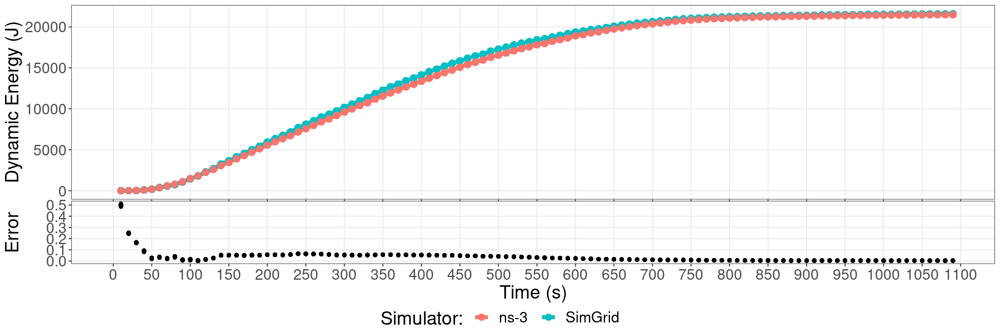

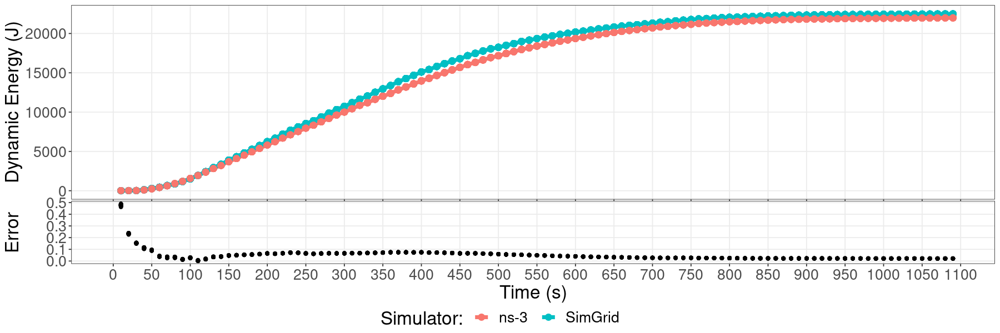

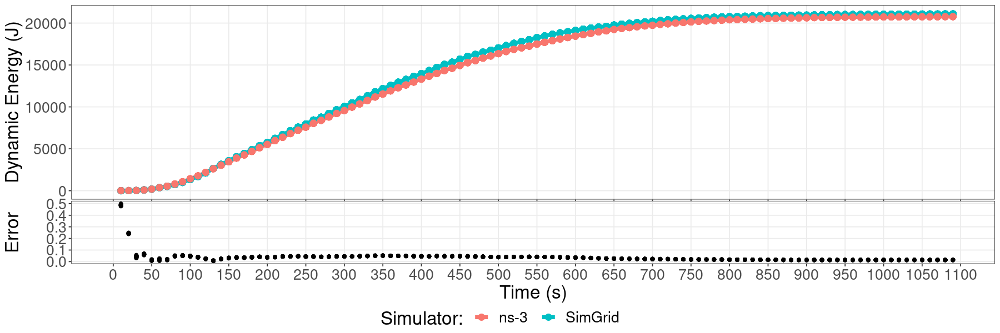

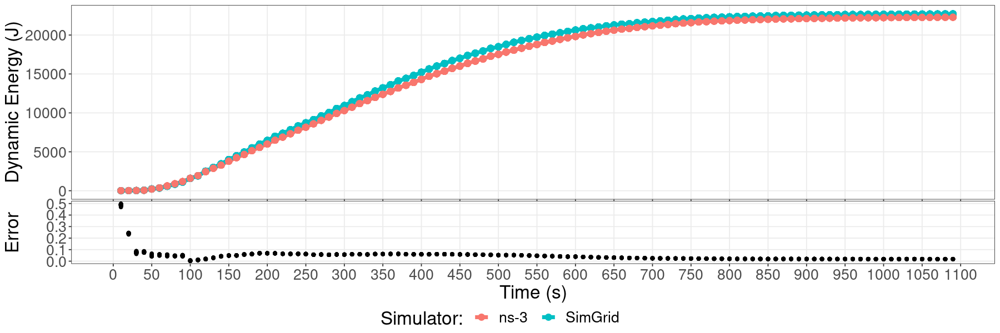

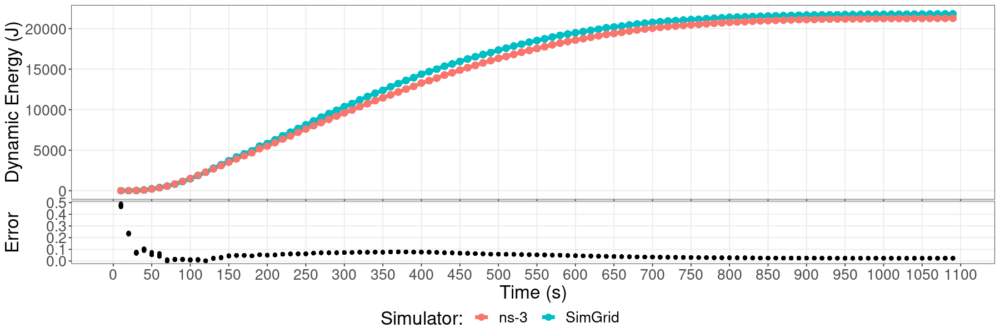

In [42]:
options(warn=-1)
d <- as_tibble(read.csv(paste("logs/1670056211/","/results.csv", sep="")))
d <- arrange(d , nbCells, maxSTAPerCell, seedP, seedNS, simulator)
newSeed <- d[1,]$seedP
dTot <- data.frame()
dTotErr <- data.frame()

draw_bars <- function(dataset, datasetErr, n) {
    options(repr.plot.width=15, repr.plot.height=5)
    datasetErr <- datasetErr %>% mutate(relerr=abs(1-(as.numeric(energy1)/as.numeric(energy2))))
    datasetErr <- datasetErr %>% mutate(relerr=abs((as.numeric(energy2)-as.numeric(energy1))/(as.numeric(energy1))))
datasetErr <- datasetErr %>% mutate_at(c('timestamp'), as.numeric)
    dataset <- dataset %>%  mutate(simulatorClean=ifelse(simulator=="ns","ns-3", "SimGrid"))
    g <- ggplot() + 
      geom_line(data=dataset, aes(NULL,NULL,x=timestamp,y=energy, colour=simulatorClean),
              size=2, alpha=1) +
      geom_point(data=dataset, aes(NULL,NULL,x=timestamp,y=energy, colour=simulatorClean),
              size=3, alpha=1) +
      scale_x_continuous(limits = c(0, 1090),breaks = seq(0, 1100, by = 50)) +
      #ggtitle(n)+
      theme_bw()+
      theme(text = element_text(size = 20), legend.position = "top",axis.text.x = element_blank(), panel.grid.minor = element_blank())+
      labs(y= "Dynamic Energy (J)", x = "Time (s)", color='Simulator:', fill='Simulator:') 


    g2 <- ggplot() + 
      geom_point(data=datasetErr, aes(x=timestamp, y=relerr))+
      scale_x_continuous(limits = c(0, 1090),breaks = seq(0, 1100, by = 50)) +
      theme_bw()+
      theme(text = element_text(size = 20), legend.position = "none",plot.margin=unit(c(-1,0,0,0), "cm"), panel.grid.minor = element_blank())+
      labs(y= "Error", x = "Time (s)") +
  scale_fill_npg()+
  scale_color_npg()
    #plot(g2)

    options(repr.plot.width=15, repr.plot.height=5)

    legend <- get_legend(g)   # get the legend of the first one plot
    prow <- plot_grid( g + theme(legend.position="none"),
           g2 + theme(legend.position="none"),
           align = 'v',
           hjust = -1,
           nrow = 2,
           rel_heights=c(6, 2))
    p <- plot_grid( prow, legend, nrow=2, rel_heights=c(1,0.1))
    plot(p)
    
        ggsave("gwifi_enDyn.pdf", plot=p, width=15,height=10) #gsplit
    embedFonts(file="gwifi_enDyn.pdf", outfile="gwifi_enDyn.pdf")
}

for( i in rownames(d) ) {

    if(strtoi(i)%%2==0) next
    if(newSeed!=d[i,]$seedP) {
        draw_bars(dTot, dTotErr, paste("nbSTATot:",d[i,]$nbSTATot,"nbCells:",d[i,]$nbCells," seedP:",d[i,]$seedP," minSTAPerCell: ",d[i,]$minSTAPerCell," maxSTAPerCell: ",d[i,]$maxSTAPerCell))
        dTot <- data.frame()
        dTotErr <- data.frame()
        newSeed <- d[i,]$seedP
    }
    fth <- d[i,]$enByPartFile
    dfthbypart <- as_tibble(read.csv(paste("logs/1670056211/",fth,sep="")))
    dfthbypart <- dfthbypart %>% mutate(seed=d[i,]$seedNS) %>% mutate(timestamp<1100)
    
    dfthbyparta <- arrange(dfthbypart, timestamp)
    #print(head(dfthbyparta))
    derr <- data.frame(matrix(ncol = 5, nrow = 0))
    n <- c("simulator1","simulator2", "timestamp", "energy1","energy2")
    colnames(derr) <- n
    for( j in rownames(dfthbyparta) ){
        if(strtoi(j)%%2==0) next
        jn <- strtoi(j)
        derr[nrow(derr) + 1,] = c(dfthbyparta[jn,]$simulator,dfthbyparta[jn+1,]$simulator,dfthbyparta[jn,]$timestamp,dfthbyparta[jn,]$energy,dfthbyparta[jn+1,]$energy)
    }
    #print(head(derr))
    dTotErr <- dTotErr %>% bind_rows(derr)
    dTot <- dTot  %>% bind_rows(dfthbypart)
}




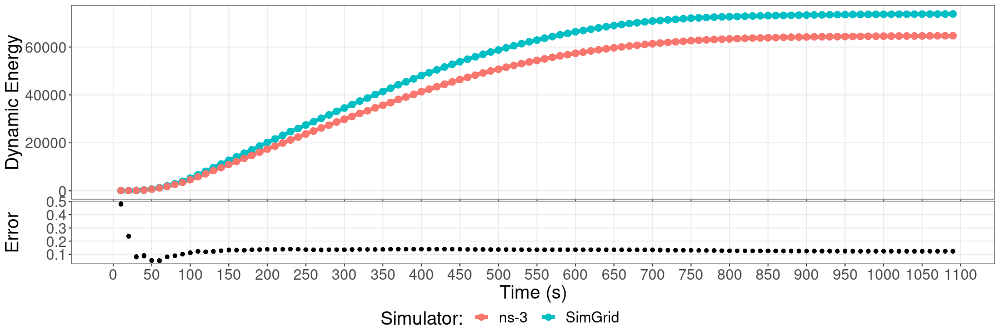

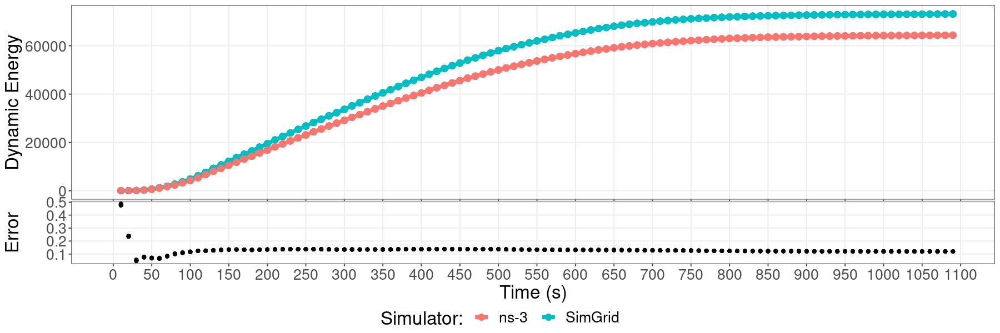

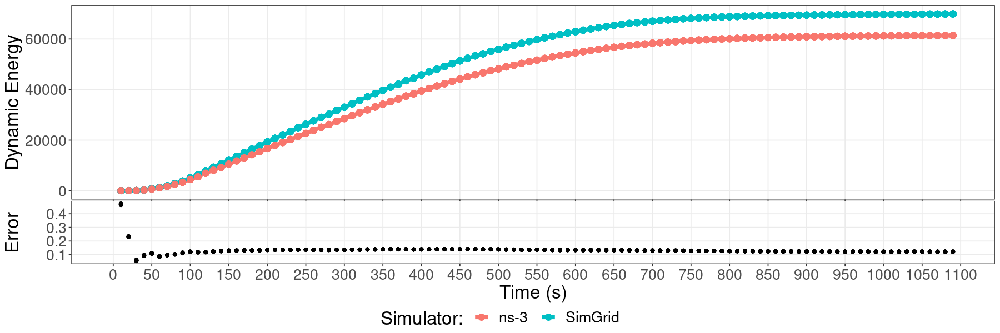

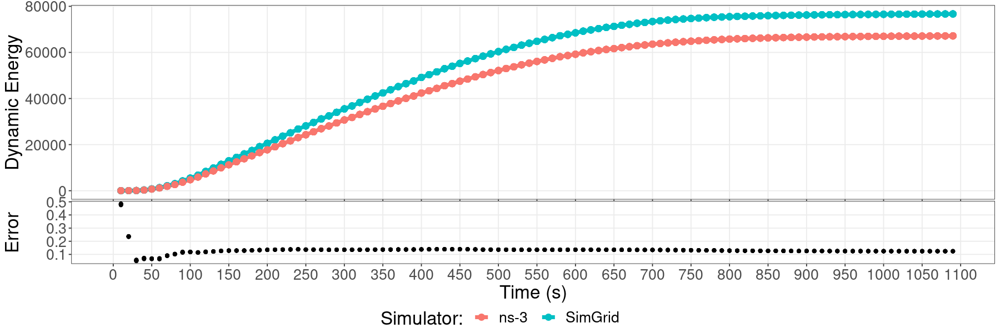

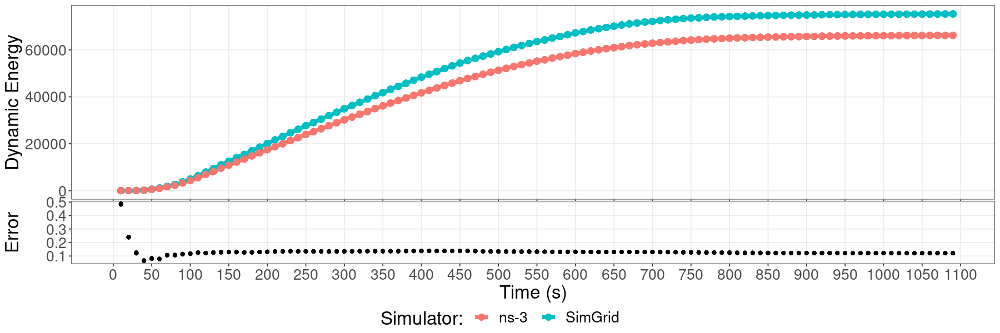

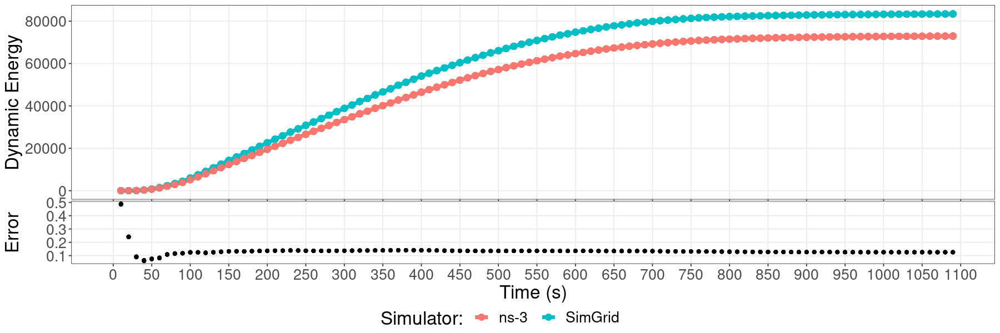

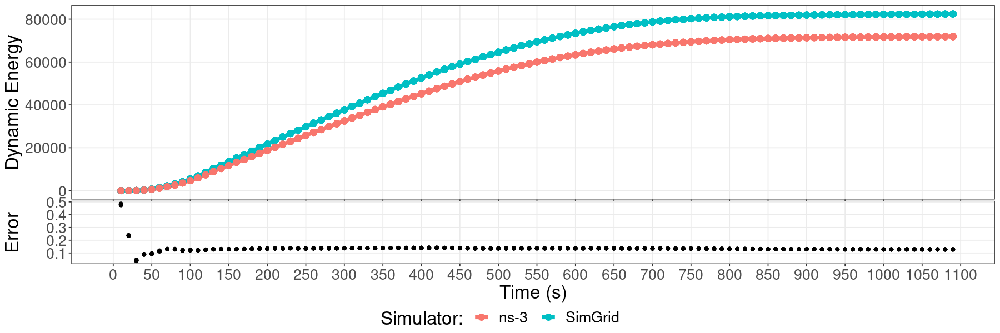

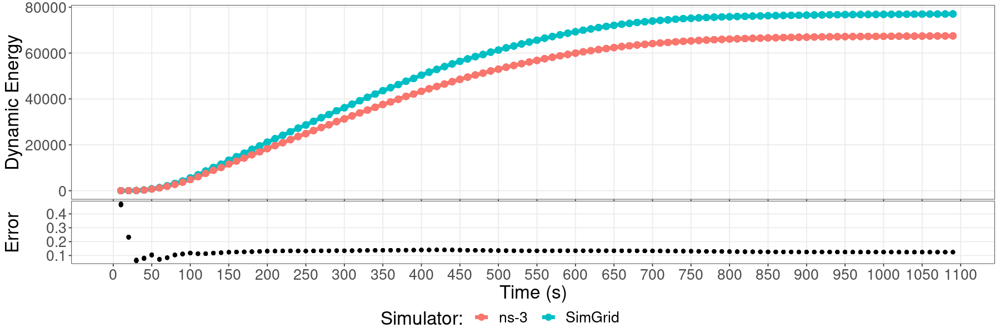

In [20]:
options(warn=-1)
d <- as_tibble(read.csv(paste("logs/1670006807/","/results.csv", sep="")))
d <- arrange(d , nbCells, maxSTAPerCell, seedP, seedNS, simulator)
newSeed <- d[1,]$seedP
dTot <- data.frame()
dTotErr <- data.frame()

draw_bars <- function(dataset, datasetErr, n) {
    options(repr.plot.width=15, repr.plot.height=5)
    datasetErr <- datasetErr %>% mutate(relerr=abs(1-(as.numeric(energy1)/as.numeric(energy2))))
    datasetErr <- datasetErr %>% mutate(relerr=abs((as.numeric(energy2)-as.numeric(energy1))/(as.numeric(energy1))))
datasetErr <- datasetErr %>% mutate_at(c('timestamp'), as.numeric)
    dataset <- dataset %>%  mutate(simulatorClean=ifelse(simulator=="ns","ns-3", "SimGrid"))
    g <- ggplot() + 
      geom_line(data=dataset, aes(NULL,NULL,x=timestamp,y=energy, colour=simulatorClean),
              size=2, alpha=1) +
      geom_point(data=dataset, aes(NULL,NULL,x=timestamp,y=energy, colour=simulatorClean),
              size=3, alpha=1) +
      scale_x_continuous(limits = c(0, 1090),breaks = seq(0, 1100, by = 50)) +
      #ggtitle(n)+
      theme_bw()+
      theme(text = element_text(size = 20), legend.position = "top",axis.text.x = element_blank(), panel.grid.minor = element_blank())+
      labs(y= "Dynamic Energy", x = "Time (s)", color='Simulator:', fill='Simulator:') 


    g2 <- ggplot() + 
      geom_point(data=datasetErr, aes(x=timestamp, y=relerr))+
      scale_x_continuous(limits = c(0, 1090),breaks = seq(0, 1100, by = 50)) +
      theme_bw()+
      theme(text = element_text(size = 20), legend.position = "none",plot.margin=unit(c(-1,0,0,0), "cm"), panel.grid.minor = element_blank())+
      labs(y= "Error", x = "Time (s)") +
  scale_fill_npg()+
  scale_color_npg()
    #plot(g2)

    options(repr.plot.width=15, repr.plot.height=5)

    legend <- get_legend(g)   # get the legend of the first one plot
    prow <- plot_grid( g + theme(legend.position="none"),
           g2 + theme(legend.position="none"),
           align = 'v',
           hjust = -1,
           nrow = 2,
           rel_heights=c(6, 2))
    p <- plot_grid( prow, legend, nrow=2, rel_heights=c(1,0.1))
    plot(p)
    
}

for( i in rownames(d) ) {

    if(strtoi(i)%%2==0) next
    if(newSeed!=d[i,]$seedP) {
        draw_bars(dTot, dTotErr, paste("nbSTATot:",d[i,]$nbSTATot,"nbCells:",d[i,]$nbCells," seedP:",d[i,]$seedP," minSTAPerCell: ",d[i,]$minSTAPerCell," maxSTAPerCell: ",d[i,]$maxSTAPerCell))
        dTot <- data.frame()
        dTotErr <- data.frame()
        newSeed <- d[i,]$seedP
    }
    fth <- d[i,]$enByPartFile
    dfthbypart <- as_tibble(read.csv(paste("logs/1670006807/",fth,sep="")))
    dfthbypart <- dfthbypart %>% mutate(seed=d[i,]$seedNS) %>% mutate(timestamp<1100)
    
    dfthbyparta <- arrange(dfthbypart, timestamp)
    #print(head(dfthbyparta))
    derr <- data.frame(matrix(ncol = 5, nrow = 0))
    n <- c("simulator1","simulator2", "timestamp", "energy1","energy2")
    colnames(derr) <- n
    for( j in rownames(dfthbyparta) ){
        if(strtoi(j)%%2==0) next
        jn <- strtoi(j)
        derr[nrow(derr) + 1,] = c(dfthbyparta[jn,]$simulator,dfthbyparta[jn+1,]$simulator,dfthbyparta[jn,]$timestamp,dfthbyparta[jn,]$energy,dfthbyparta[jn+1,]$energy)
    }
    #print(head(derr))
    dTotErr <- dTotErr %>% bind_rows(derr)
    dTot <- dTot  %>% bind_rows(dfthbypart)
}




<a id="tot"></a>
# Overall energy consumption

The logs obtained by running this experiment are in the archive: `logs/1670146863.tar.xz`, the parsed results in `logs/1670146863/results.csv`

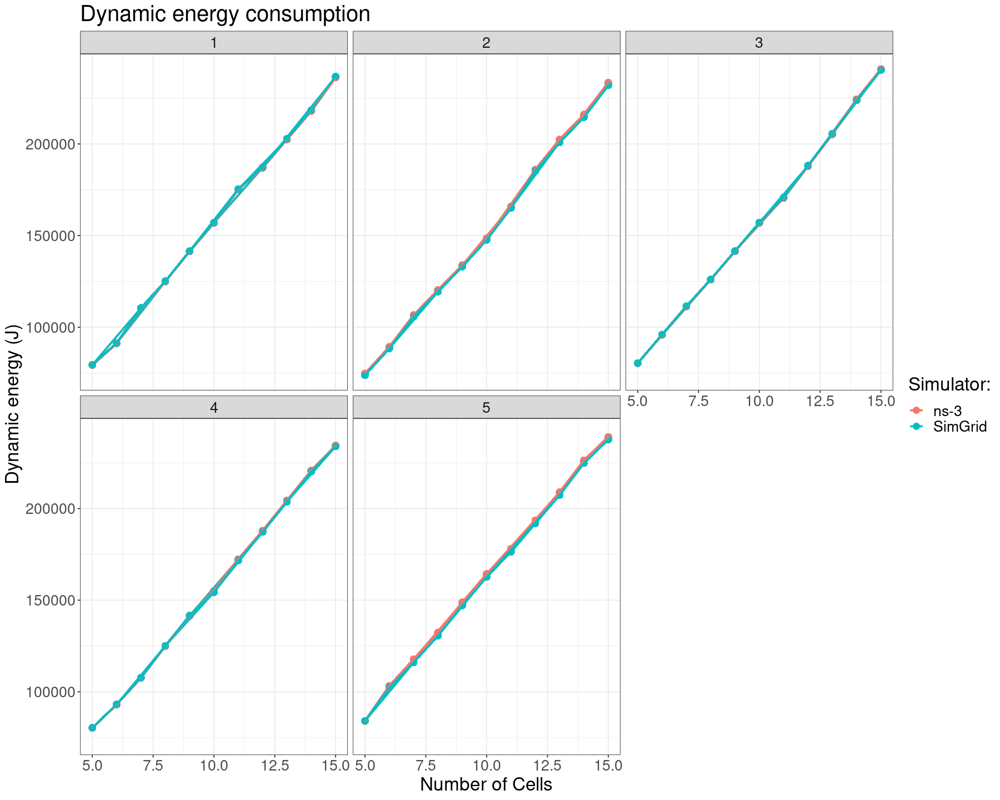

In [47]:
d <- as_tibble(read.csv(paste("logs/1670146863/","/results.csv", sep="")))%>% mutate(cleansimulator=ifelse(simulator=="ns3", "ns-3","SimGrid"))

options(repr.plot.width=15, repr.plot.height=12)
g <- ggplot(data=d) +
  geom_point(aes(x=nbCells, y=totEnergy, group=interaction(cleansimulator,factor(seedNS)), color=cleansimulator), size=3)+
  geom_line(aes(x=nbCells, y=totEnergy, group=interaction(cleansimulator,factor(seedNS)), color=cleansimulator), size=1)+
  theme_bw()+
  facet_wrap(~seedP)+
  labs(y= "Dynamic energy (J)", x = "Number of Cells", color='Simulator:', fill='Simulator:')+
  theme(text = element_text(size = 20))+
  ggtitle("Dynamic energy consumption")
g

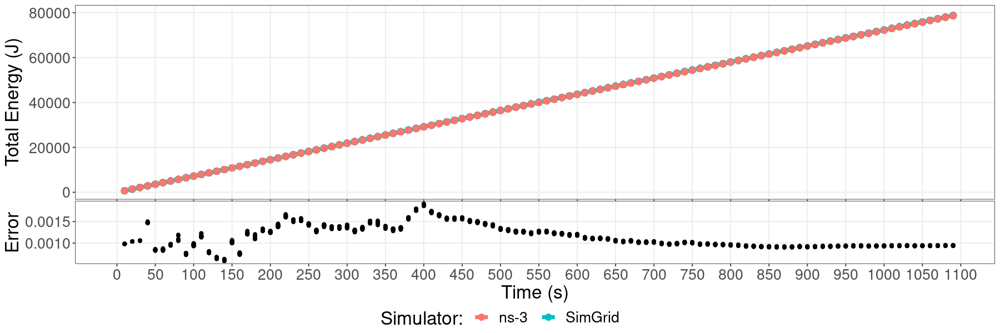

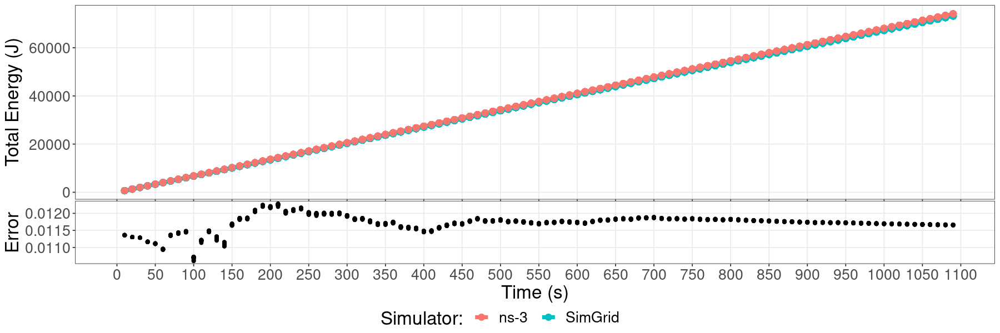

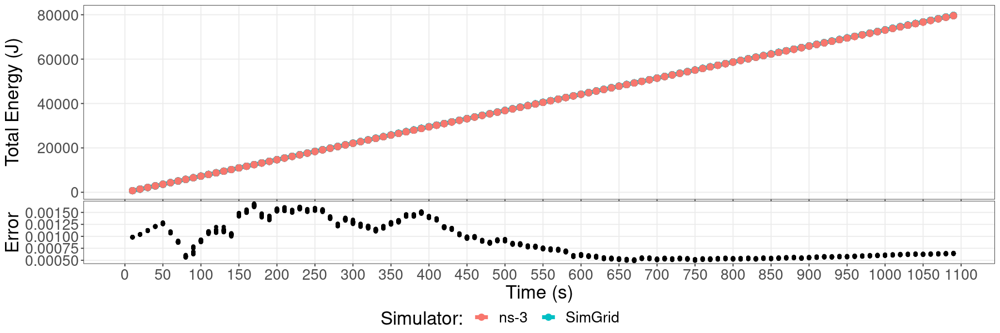

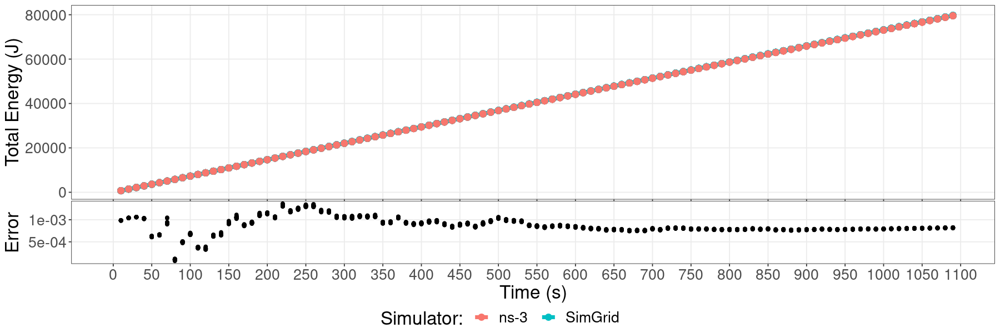

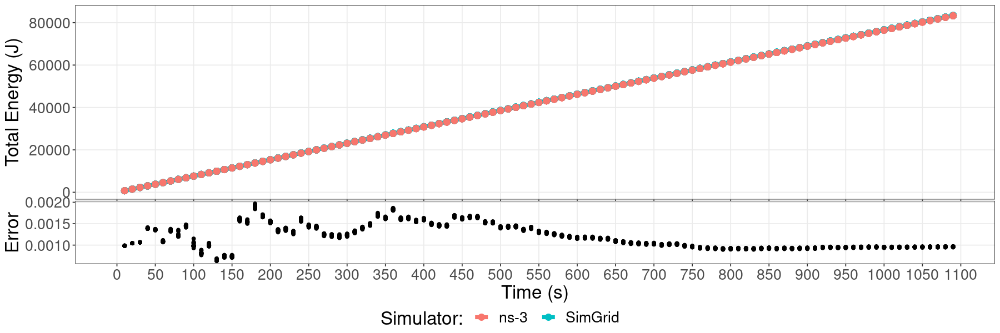

...

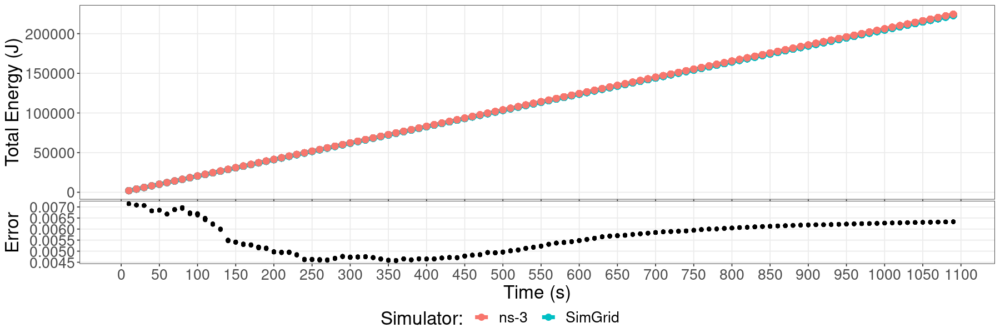

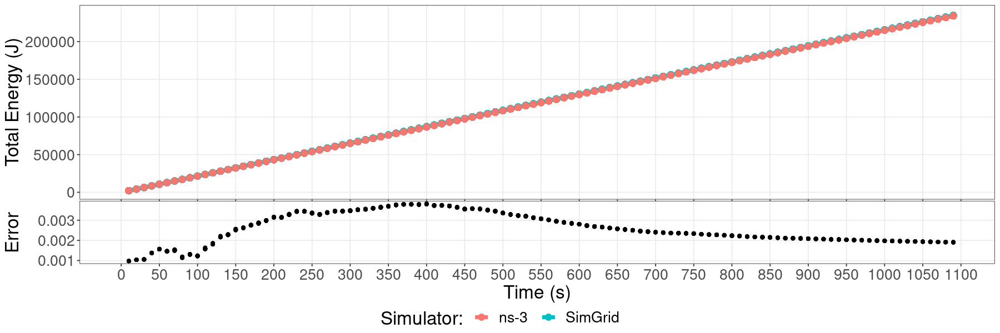

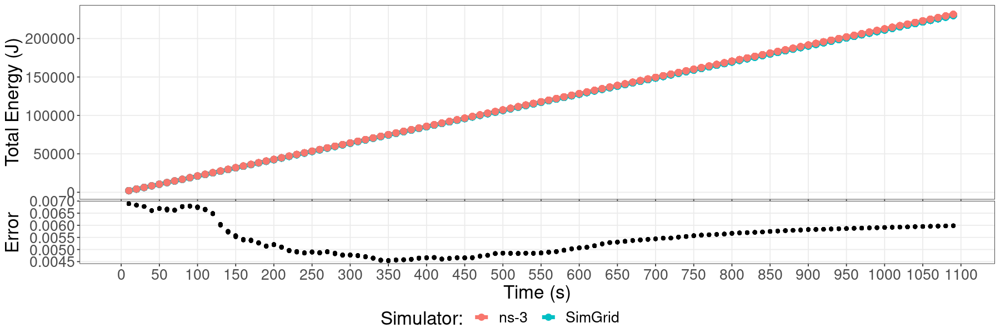

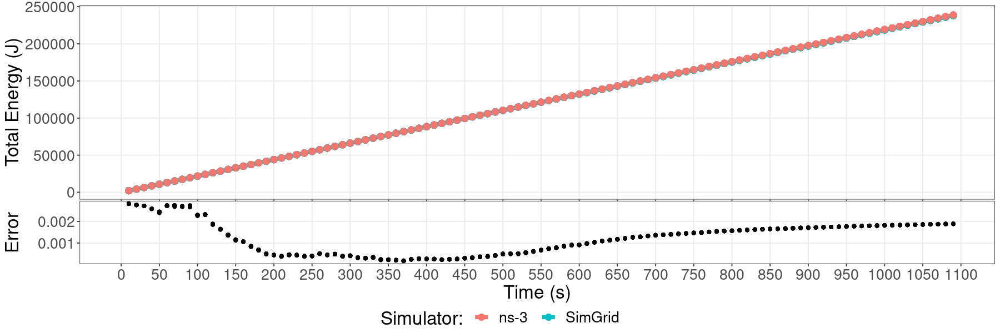

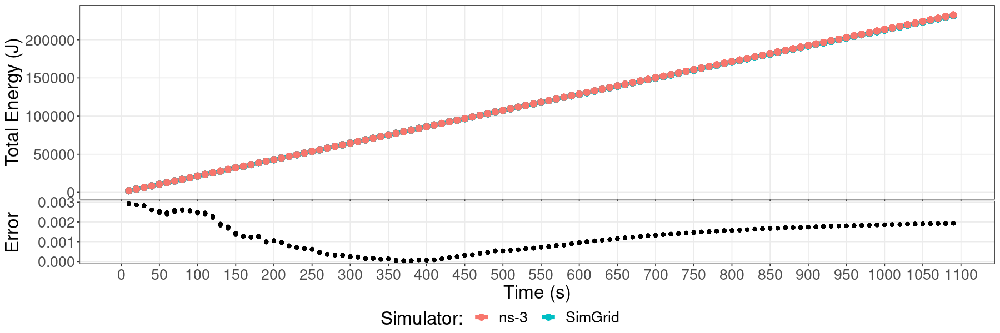

In [48]:
options(warn=-1)
d <- as_tibble(read.csv(paste("logs/1670146863/","/results.csv", sep="")))
d <- arrange(d , nbCells, maxSTAPerCell, seedP, seedNS, simulator)
newSeed <- d[1,]$seedP
dTot <- data.frame()
dTotErr <- data.frame()

draw_bars <- function(dataset, datasetErr, n) {
    options(repr.plot.width=15, repr.plot.height=5)
    datasetErr <- datasetErr %>% mutate(relerr=abs(1-(as.numeric(energy1)/as.numeric(energy2))))
    datasetErr <- datasetErr %>% mutate(relerr=abs((as.numeric(energy2)-as.numeric(energy1))/(as.numeric(energy1))))
datasetErr <- datasetErr %>% mutate_at(c('timestamp'), as.numeric)
    dataset <- dataset %>%  mutate(simulatorClean=ifelse(simulator=="ns","ns-3", "SimGrid"))
    g <- ggplot() + 
      geom_line(data=dataset, aes(NULL,NULL,x=timestamp,y=energy, colour=simulatorClean),
              size=2, alpha=1) +
      geom_point(data=dataset, aes(NULL,NULL,x=timestamp,y=energy, colour=simulatorClean),
              size=3, alpha=1) +
      scale_x_continuous(limits = c(0, 1090),breaks = seq(0, 1100, by = 50)) +
      #ggtitle(n)+
      theme_bw()+
      theme(text = element_text(size = 20), legend.position = "top",axis.text.x = element_blank(), panel.grid.minor = element_blank())+
      labs(y= "Total Energy (J)", x = "Time (s)", color='Simulator:', fill='Simulator:') 


    g2 <- ggplot() + 
      geom_point(data=datasetErr, aes(x=timestamp, y=relerr))+
      scale_x_continuous(limits = c(0, 1090),breaks = seq(0, 1100, by = 50)) +
      theme_bw()+
      theme(text = element_text(size = 20), legend.position = "none",plot.margin=unit(c(-1,0,0,0), "cm"), panel.grid.minor = element_blank())+
      labs(y= "Error", x = "Time (s)") +
  scale_fill_npg()+
  scale_color_npg()
    #plot(g2)

    options(repr.plot.width=15, repr.plot.height=5)

    legend <- get_legend(g)   # get the legend of the first one plot
    prow <- plot_grid( g + theme(legend.position="none"),
           g2 + theme(legend.position="none"),
           align = 'v',
           hjust = -1,
           nrow = 2,
           rel_heights=c(6, 2))
    p <- plot_grid( prow, legend, nrow=2, rel_heights=c(1,0.1))
    plot(p)
    
        ggsave("gwifi_enTot.pdf", plot=p, width=15,height=10) #gsplit
    embedFonts(file="gwifi_enTot.pdf", outfile="gwifi_enTot.pdf")
}

for( i in rownames(d) ) {

    if(strtoi(i)%%2==0) next
    if(newSeed!=d[i,]$seedP) {
        draw_bars(dTot, dTotErr, paste("nbSTATot:",d[i,]$nbSTATot,"nbCells:",d[i,]$nbCells," seedP:",d[i,]$seedP," minSTAPerCell: ",d[i,]$minSTAPerCell," maxSTAPerCell: ",d[i,]$maxSTAPerCell))
        dTot <- data.frame()
        dTotErr <- data.frame()
        newSeed <- d[i,]$seedP
    }
    fth <- d[i,]$enByPartFile
    dfthbypart <- as_tibble(read.csv(paste("logs/1670146863/",fth,sep="")))
    dfthbypart <- dfthbypart %>% mutate(seed=d[i,]$seedNS) %>% mutate(timestamp<1100)
    
    dfthbyparta <- arrange(dfthbypart, timestamp)
    #print(head(dfthbyparta))
    derr <- data.frame(matrix(ncol = 5, nrow = 0))
    n <- c("simulator1","simulator2", "timestamp", "energy1","energy2")
    colnames(derr) <- n
    for( j in rownames(dfthbyparta) ){
        if(strtoi(j)%%2==0) next
        jn <- strtoi(j)
        derr[nrow(derr) + 1,] = c(dfthbyparta[jn,]$simulator,dfthbyparta[jn+1,]$simulator,dfthbyparta[jn,]$timestamp,dfthbyparta[jn,]$energy,dfthbyparta[jn+1,]$energy)
    }
    #print(head(derr))
    dTotErr <- dTotErr %>% bind_rows(derr)
    dTot <- dTot  %>% bind_rows(dfthbypart)
}




<a id="perf"></a>
# Performance comparison

The logs obtained by running this experiment are in the archives: `logs/1670056211.tar.xz` and `logs/1670006807.tar.xz` (the few very large experiments that require a lot of memory), the parsed results in `logs/1670056211/results.csv`and `logs/1670006807/results.csv`

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



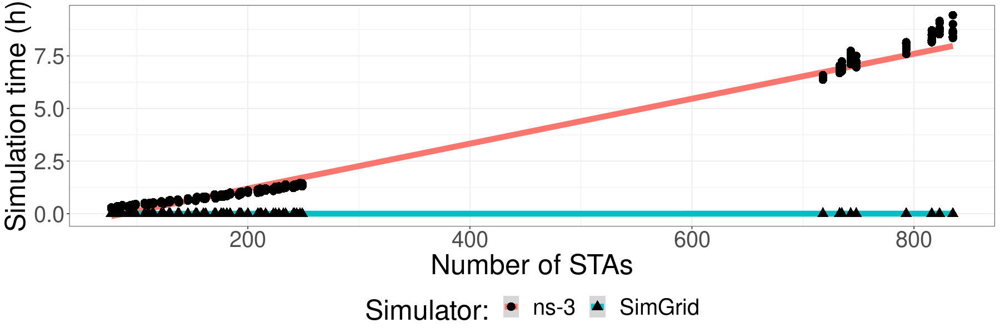

`geom_smooth()` using formula 'y ~ x'



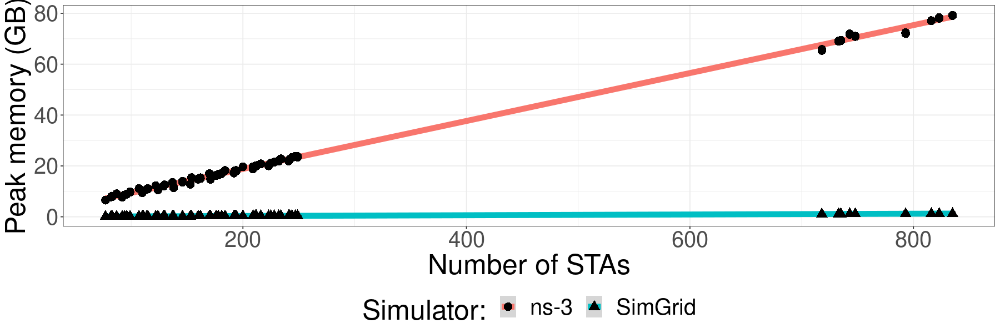

In [46]:
d <- as_tibble(read.csv(paste("logs/1670056211/","/results.csv", sep="")))

d2 <- as_tibble(read.csv(paste("logs/1670006807/","/results.csv", sep=""))) #1653066955 #1652981653  #1652807099
d <- rbind(d, d2)
d <- arrange(d , nbCells, maxSTAPerCell, seedP, seedNS, simulator) %>% mutate(cleansimulator=ifelse(simulator=="ns3", "ns-3","SimGrid"))


p <- ggplot(d, aes(x=nbSTATot, y=wallClock/3600, group=interaction(seedP,cleansimulator)))+
    geom_smooth(method='lm', size=3, aes(color=cleansimulator, x=nbSTATot, y=wallClock/3600, group=interaction(cleansimulator)))+
    geom_point(aes(shape=cleansimulator), size=4)+
  theme_bw()+
  theme(text = element_text(size = 30), legend.position = "bottom")+
  labs(y= "Simulation time (h)", x = "Number of STAs", color='Simulator:', fill='Simulator:', shape="Simulator:")

p

ggsave("gwifi_perfWC.pdf", plot=p,width=15,height=8) #gsplit
embedFonts(file="gwifi_perfWC.pdf", outfile="gwifi_perfWC.pdf")

p <- ggplot(d, aes(x=nbSTATot, y=peakMemUsage/1e+6, group=interaction(seedP,cleansimulator)))+
    geom_smooth(method='lm', size=3, aes(color=cleansimulator,x=nbSTATot, y=peakMemUsage/1e+6, group=interaction(cleansimulator)))+
    geom_point(aes(shape=cleansimulator), size=4)+
  theme_bw()+
  theme(text = element_text(size = 30), legend.position = "bottom")+
  labs(y= "Peak memory (GB)", x = "Number of STAs", color='Simulator:', fill='Simulator:', shape='Simulator:')

p

ggsave("gwifi_perfMem.pdf", plot=p,width=15,height=8) #gsplit
embedFonts(file="gwifi_perfMem.pdf", outfile="gwifi_perfMem.pdf")